In [3]:
import tensorflow as tf
from tensorflow import keras

import os
import tempfile

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns 

import sklearn
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

### Import cluster db

In [4]:
cluster_db = pd.read_pickle('cluster_ml.gz')

In [5]:
training = np.where(cluster_db['class'] == 'fov', -1, 0)
training = np.where(cluster_db['class'] == 'event', 1, training)

cluster_db.insert(44, 'training', training, True)

In [6]:
# set NaN in color charge columns to 0
cluster_db['charge_green'] = cluster_db['charge_green'].fillna(0)
cluster_db['charge_blue'] = cluster_db['charge_blue'].fillna(0)
cluster_db['charge_red'] = cluster_db['charge_red'].fillna(0)

-------------------------------------------------------------------------------------------------------------

# Build Model

In [7]:
mpl.rcParams['figure.figsize'] = (12, 10)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

### Prepare Data

In [8]:
def prepare_df(dataframe, columns, train):
    cleaned_df = dataframe.copy()
    
    if train == True:
        columns_train = columns.copy()
        columns_train.append('training')
        cleaned_df = cleaned_df[cleaned_df['class'] != 'fov']
        cleaned_df = cleaned_df[columns_train]
    elif train == False:
        cleaned_df = cleaned_df[columns]

    # Convert columns if necessary.
    for i in cleaned_df.columns:
        if any(x in i for x in ('charge', 'noise')):
            # The columns cover a huge range. Convert to log-space.
            eps = 0.001 # 0 => 0.1¢
            cleaned_df['log_' + i] = np.log(cleaned_df.pop(i)+eps)
        if 'pixel' in i:
            # Take square root.
            cleaned_df['sqrt_' + i] = np.sqrt(cleaned_df.pop(i))
        #if 'time' in i:
        #    cleaned_df['str_' + i] = cleaned_df.pop(i).strftime()

    return cleaned_df

In [9]:
columns = [
    'charge', 'noise', #'n_pixel',
    'box_size_x', 'box_size_y',
    'charge_green', 'noise_green', 'n_pixel_green',
    'charge_blue', 'noise_blue', 'n_pixel_blue',
    'charge_red', 'noise_red', 'n_pixel_red',
    #'time'
]

cleaned_df = prepare_df(cluster_db, columns, train=True)

In [10]:
cleaned_df

,box_size_x,box_size_y,training,log_charge,log_noise,log_charge_green,log_noise_green,sqrt_n_pixel_green,log_charge_blue,log_noise_blue,sqrt_n_pixel_blue,log_charge_red,log_noise_red,sqrt_n_pixel_red
15,15.109660,12.362449,0,12.164330,10.234830,11.270942,9.168381,2.828427,10.750646,8.911910,2.236068,11.107303,9.291719,2.645751
16,9.998460,15.348514,0,11.889208,9.882988,11.130376,9.136909,2.645751,10.255705,8.202931,1.732051,10.800177,8.802454,2.236068
27,8.485281,19.091881,0,11.946269,10.077754,11.318012,9.619363,2.828427,10.075047,7.640561,1.732051,10.783258,8.805839,2.236068
28,8.805123,22.186594,0,11.969981,10.010114,11.087170,9.032214,2.645751,10.106213,7.971525,2.000000,11.129015,9.304261,2.828427
32,11.620002,27.640770,0,12.086499,10.156430,11.749569,9.851199,3.872983,9.864870,7.554669,1.414214,10.358331,8.489916,2.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
544264,11.852756,36.496609,0,11.688459,12.661051,10.849143,11.815205,3.605551,10.507326,11.465682,3.000000,10.345468,11.345078,2.828427
544265,11.679111,18.288219,0,11.559623,12.498755,10.879887,11.805046,3.605551,9.971369,11.038548,2.449490,10.318183,11.182333,2.645751
544266,11.343531,11.343531,0,11.121268,12.037266,10.542331,11.441668,3.162278,9.839314,10.780853,2.236068,9.301183,10.229947,1.732051
544267,15.479144,15.830943,0,11.548453,12.497485,10.888116,11.845158,3.464102,10.335185,11.312749,2.645751,9.866974,10.744992,2.000000


#### Split up in train, test, validation

In [11]:
# split and shuffle the dataset
train_df, test_df = train_test_split(cleaned_df, test_size=0.2)
train_df, val_df = train_test_split(train_df, test_size=0.2)

# form np arrays of labels and features
train_labels = np.array(train_df.pop('training'))
bool_train_labels = train_labels != 0
val_labels = np.array(val_df.pop('training'))
test_labels = np.array(test_df.pop('training'))

train_features = np.array(train_df)
val_features = np.array(val_df)
test_features = np.array(test_df)

In [12]:
# normalize the data
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)

val_features = scaler.transform(val_features)
test_features = scaler.transform(test_features)

train_features = np.clip(train_features, -5, 5)
val_features = np.clip(val_features, -5, 5)
test_features = np.clip(test_features, -5, 5)


#print('Training labels shape:', train_labels.shape)
#print('Validation labels shape:', val_labels.shape)
#print('Test labels shape:', test_labels.shape)
#
#print('Training features shape:', train_features.shape)
#print('Validation features shape:', val_features.shape)
#print('Test features shape:', test_features.shape)


## ----------------------------------------------------------------------------------------------------------

### Define Model

In [13]:
METRICS = [
      keras.metrics.TruePositives(name='tp'),
      keras.metrics.FalsePositives(name='fp'),
      keras.metrics.TrueNegatives(name='tn'),
      keras.metrics.FalseNegatives(name='fn'), 
      keras.metrics.BinaryAccuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='auc'),
      keras.metrics.AUC(name='prc', curve='PR'), # precision-recall curve
]

def make_model(metrics=METRICS, output_bias=None):
  if output_bias is not None:
    output_bias = tf.keras.initializers.Constant(output_bias)
  model = keras.Sequential([
      keras.layers.Dense(
          16, activation='relu',
          input_shape=(train_features.shape[-1],)),
      keras.layers.Dropout(0.5),
      keras.layers.Dense(16, activation='relu'),
      keras.layers.Dropout(0.5),
      keras.layers.Dense(16, activation='relu'),
      keras.layers.Dropout(0.5),
      keras.layers.Dense(1, activation='sigmoid',
                         bias_initializer=output_bias)
  ])

  model.compile(
      optimizer=keras.optimizers.Adam(learning_rate=1e-3),
      loss=keras.losses.BinaryCrossentropy(),
      metrics=metrics)

  return model

2022-10-28 16:47:46.700895: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/straw/geant4.10.03.p03-install/lib:/home/straw/rootsoft16/root/lib:/home/straw/rootsoft16/root/lib/:
2022-10-28 16:47:46.701385: W tensorflow/stream_executor/cuda/cuda_driver.cc:263] failed call to cuInit: UNKNOWN ERROR (303)
2022-10-28 16:47:46.701442: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (straw-MacBookAir): /proc/driver/nvidia/version does not exist
2022-10-28 16:47:46.702133: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropria

In [14]:
EPOCHS = 100
BATCH_SIZE = 1024

# early stopping to prevent overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_prc', 
    verbose=1,
    patience=10,
    mode='max',
    restore_best_weights=True)

In [15]:
labels, counts = np.unique(cluster_db['class'], return_counts=True)
noise = counts[2]
events = counts[0]
total = noise + events
print('Examples:\n    Total: {}\n    Events: {} ({:.2f}% of total)\n'.format(
    total, events, 100 * events / total))

# set a bias for the imbalanced dataset
initial_bias = np.log([events/noise])
print('Initial bias:', initial_bias, ', Events/Noise:', events/noise)

Examples:
    Total: 69341
    Events: 3997 (5.76% of total)

Initial bias: [-2.79412154] , Events/Noise: 0.0611685847208619


In [16]:
model = make_model(output_bias=initial_bias)
initial_weights = os.path.join(tempfile.mkdtemp(), 'initial_weights')
model.save_weights(initial_weights)

## ----------------------------------------------------------------------------------------------------------

### Class Weights

In [17]:
# Scaling by total/2 helps keep the loss to a similar magnitude.
# The sum of the weights of all examples stays the same.
weight_for_0 = (1 / noise) * (total / 2.0)
weight_for_1 = (1 / events) * (total / 2.0)

class_weight = {0: weight_for_0, 1: weight_for_1}

print('Weight for class 0: {:.2f}'.format(weight_for_0))
print('Weight for class 1: {:.2f}'.format(weight_for_1))

Weight for class 0: 0.53
Weight for class 1: 8.67


### Train Model

In [18]:
weighted_model = make_model()
weighted_model.load_weights(initial_weights)

weighted_history = weighted_model.fit(
    train_features,
    train_labels,
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    callbacks=[early_stopping],
    validation_data=(val_features, val_labels),
    # The class weights go here
    class_weight=class_weight)

Epoch 1/100
44/44 [==============================] - 3s 25ms/step - loss: 0.9534 - tp: 678.0000 - fp: 1224.0000 - tn: 40594.0000 - fn: 1881.0000 - accuracy: 0.9300 - precision: 0.3565 - recall: 0.2649 - auc: 0.6684 - prc: 0.2152 - val_loss: 0.2029 - val_tp: 254.0000 - val_fp: 168.0000 - val_tn: 10253.0000 - val_fn: 420.0000 - val_accuracy: 0.9470 - val_precision: 0.6019 - val_recall: 0.3769 - val_auc: 0.9470 - val_prc: 0.5468
Epoch 2/100
44/44 [==============================] - 0s 7ms/step - loss: 0.6342 - tp: 1398.0000 - fp: 2979.0000 - tn: 38839.0000 - fn: 1161.0000 - accuracy: 0.9067 - precision: 0.3194 - recall: 0.5463 - auc: 0.7913 - prc: 0.3386 - val_loss: 0.2330 - val_tp: 574.0000 - val_fp: 464.0000 - val_tn: 9957.0000 - val_fn: 100.0000 - val_accuracy: 0.9492 - val_precision: 0.5530 - val_recall: 0.8516 - val_auc: 0.9710 - val_prc: 0.6804
Epoch 3/100
44/44 [==============================] - 0s 7ms/step - loss: 0.4773 - tp: 1798.0000 - fp: 2979.0000 - tn: 38839.0000 - fn: 761.00

## ----------------------------------------------------------------------------------------------------------

### Model History

In [19]:
def plot_metrics(history):
  metrics = ['loss', 'prc', 'precision', 'recall']
  for n, metric in enumerate(metrics):
    name = metric.replace("_"," ").capitalize()
    plt.subplot(2,2,n+1)
    plt.plot(history.epoch, history.history[metric], color=colors[0], label='Train')
    plt.plot(history.epoch, history.history['val_'+metric],
             color=colors[0], linestyle="--", label='Val')
    plt.xlabel('Epoch')
    plt.ylabel(name)
    if metric == 'loss':
      plt.ylim([0, plt.ylim()[1]])
    elif metric == 'auc':
      plt.ylim([0.8,1])
    else:
      plt.ylim([0,1])

    plt.legend()

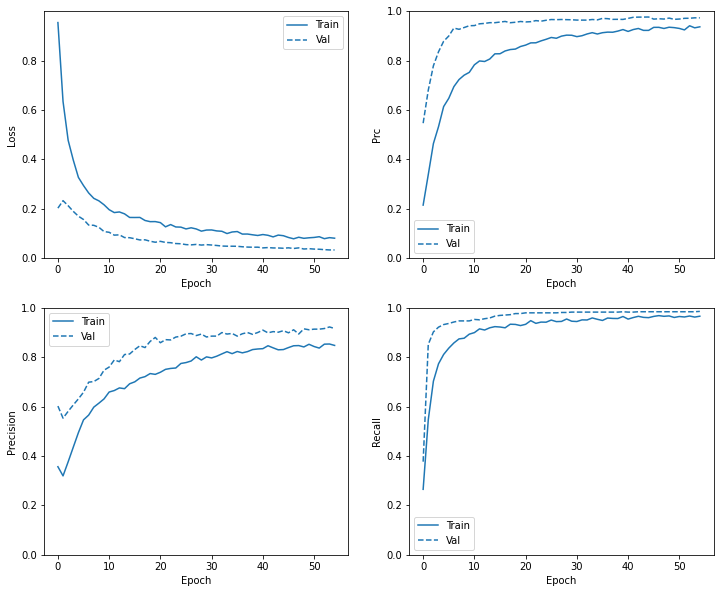

In [26]:
plot_metrics(weighted_history)

In [21]:
weighted_results = weighted_model.evaluate(test_features, test_labels,
                                           batch_size=BATCH_SIZE, verbose=0)
for name, value in zip(weighted_model.metrics_names, weighted_results):
  print(name, ': ', value)
print()

loss :  0.04128720611333847
tp :  753.0
fp :  73.0
tn :  13032.0
fn :  11.0
accuracy :  0.9939433336257935
precision :  0.9116222858428955
recall :  0.985602080821991
auc :  0.9986267685890198
prc :  0.9711753726005554



In [22]:
def plot_cm(labels, predictions, p=0.5):
  cm = confusion_matrix(labels, predictions > p)
  plt.figure(figsize=(5,5))
  sns.heatmap(cm, annot=True, fmt="d")
  plt.title('Confusion matrix @{:.2f}'.format(p))
  plt.ylabel('Actual label')
  plt.xlabel('Predicted label')

  print('Noise Correct (True Negatives): ', cm[0][0])
  print('Noise Incorrect (False Positives): ', cm[0][1])
  print('Events Incorrect (False Negatives): ', cm[1][0])
  print('Events Correct (True Positives): ', cm[1][1])
  print('Total Events: ', np.sum(cm[1]))

14/14 [==============================] - 0s 2ms/step
Noise Correct (True Negatives):  13032
Noise Incorrect (False Positives):  73
Events Incorrect (False Negatives):  11
Events Correct (True Positives):  753
Total Events:  764


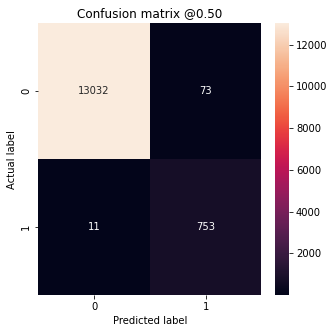

In [23]:
train_predictions_weighted = weighted_model.predict(train_features, batch_size=BATCH_SIZE)
test_predictions_weighted = weighted_model.predict(test_features, batch_size=BATCH_SIZE)

plot_cm(test_labels, test_predictions_weighted)

-------------------------------------------------------------------------------------------------------------

## Predicts Labels for all Clusters

In [24]:
cluster_features = prepare_df(cluster_db, columns, train=False)
cluster_features = scaler.transform(np.array(cluster_features))
cluster_features = np.clip(cluster_features, -5, 5)

In [25]:
pred = weighted_model.predict(cluster_features)
pred

3181/3181 [==============================] - 7s 2ms/step


array([[0.00760451],
       [0.00382191],
       [0.00610282],
       ...,
       [0.99999803],
       [0.9987174 ],
       [0.99993885]], dtype=float32)

In [23]:
test = cluster_db.copy()
test.insert(45, 'prediction', np.where(pred > 0.5, 1, 0), True)

In [24]:
import plotly.express as px

# mask and sort
df_plot = test.sort_values('charge')
df_plot['sqrt_n_pixel'] = np.sqrt(df_plot.n_pixel)

# plot
fig = px.scatter(df_plot, # dataframe
           x='box_center_y',  # column name of dataframe, or list, array
           y='box_center_x',
           hover_data=['charge'],
           size='sqrt_n_pixel', 
           symbol='class', 
           color=df_plot.prediction.astype(str), # workaround for color log scale
           opacity=1,
           #line.width=0
           )

# get rid of white outlines
fig.update_traces(marker_line_width=0)


# aspect x/y equal
fig.update_yaxes(
    scaleanchor = "x",
    scaleratio = 1,
  )


fig.show()

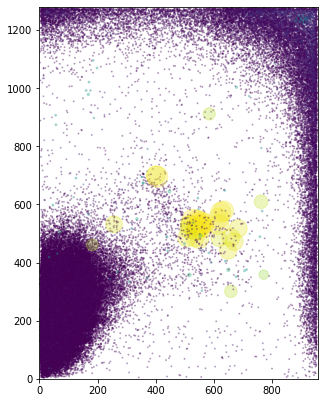

In [243]:
import scipy.interpolate
import matplotlib.colors

s_min=1.
s_max=5e2
norm_size = scipy.interpolate.interp1d([test[test.prediction ==0].n_pixel.min(), test[test.prediction ==0].n_pixel.max()], [s_min, s_max])

fig, ax = plt.subplots(figsize=(5, 7))
plt.scatter(test[test.prediction ==0].center_of_mass_y, test[test.prediction ==0].center_of_mass_x, c=test[test.prediction ==0].n_pixel, s=norm_size(test[test.prediction ==0].n_pixel), 
            cmap='viridis', norm=matplotlib.colors.LogNorm(),
            alpha=.3)

plt.xlim(0, 960)
plt.ylim(0, 1280)
ax.set_aspect('equal', 'box')
plt.show()

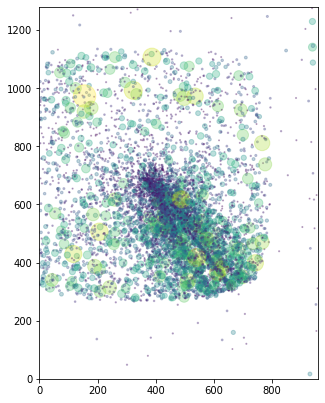

In [244]:
import scipy.interpolate
import matplotlib.colors

s_min=1.
s_max=5e2
norm_size = scipy.interpolate.interp1d([test[test.prediction ==1].n_pixel.min(), test[test.prediction ==1].n_pixel.max()], [s_min, s_max])

fig, ax = plt.subplots(figsize=(5, 7))
plt.scatter(test[test.prediction ==1].center_of_mass_y, test[test.prediction ==1].center_of_mass_x, c=test[test.prediction ==1].n_pixel, s=norm_size(test[test.prediction ==1].n_pixel), 
            cmap='viridis', norm=matplotlib.colors.LogNorm(),
            alpha=.3)

plt.xlim(0, 960)
plt.ylim(0, 1280)
ax.set_aspect('equal', 'box')
plt.show()